# Color Mapping Creation for Miniature-Scale Physical-World Experiment

In [10]:
%matplotlib inline
import numpy as np
import pandas as pd
import cv2
import matplotlib.pyplot as plt


# STEP1: Capture a gray-scale pallet

Since the DRP attack uses only grayscale perturbations, we need to know what color the camera perceives grayscale to be. Thus, we prepare a gray-scale pallet containg all 256 (8-bit) grayscale colors and capture it.

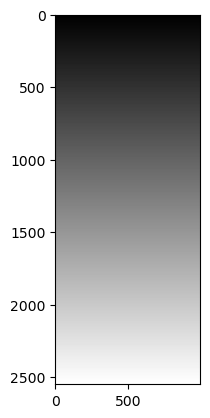

In [11]:
### Gray scale pallet
patch = np.zeros((255 * 10, 1000), dtype=np.uint8)
for i in range(0, 255):
    patch[i*10: (i+1) * 10] = i
plt.imshow(patch, cmap='gray')


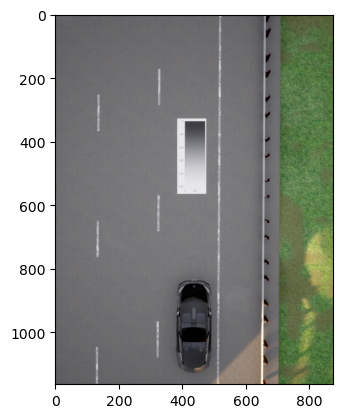

In [12]:
### Capture it in a camera (OpenPilot dashcam)
img = cv2.cvtColor(cv2.imread('data/pallet.png'), cv2.COLOR_BGR2RGB)
plt.imshow(img)

# STEP2: Extract color mappings

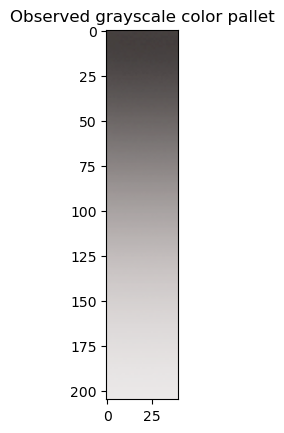

In [13]:
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)


# img[340:545, 420:460] = [255,192,203]

# plt.imshow(img)
# plt.show()

bev = img[340:545, 420:460] 
plt.imshow(bev)
plt.title('Observed grayscale color pallet')
plt.imshow(bev)
plt.show()



           R        G        B    X        mean
0     70.850   65.725   65.050    0   67.208333
1     69.950   64.500   63.825    1   66.091667
2     68.975   63.550   62.875    2   65.133333
3     69.125   63.525   62.500    3   65.050000
4     68.250   62.800   61.975    4   64.341667
..       ...      ...      ...  ...         ...
200  234.000  231.925  231.300  200  232.408333
201  234.400  232.000  231.650  201  232.683333
202  234.375  232.000  232.000  202  232.791667
203  235.000  232.525  232.000  203  233.175000
204  235.000  233.000  232.575  204  233.525000

[205 rows x 5 columns]


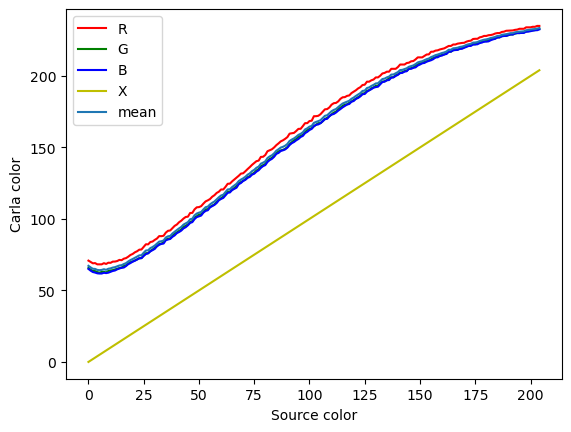

In [14]:



df = pd.DataFrame(bev.mean(axis=1), columns=['R','G','B'])#.plot(style=['r', 'g', 'b'])

df['X'] = df.index.values
df['mean'] =df[['R','G','B']].mean(axis=1)
df.plot(style=['r', 'g', 'b', 'y'])
plt.ylabel('Carla color')
plt.xlabel('Source color')

print(df)


The yellow line is the case that the obserbed colors and the prited pallee colors are the same. As shown, the colors less than 50 are obserbed brighter. The colors over 50 are observed darker. If you change the lighting conditions or the printer, this color mapping will be different.

# STEP3: Complete all 256 grayscale color mappings

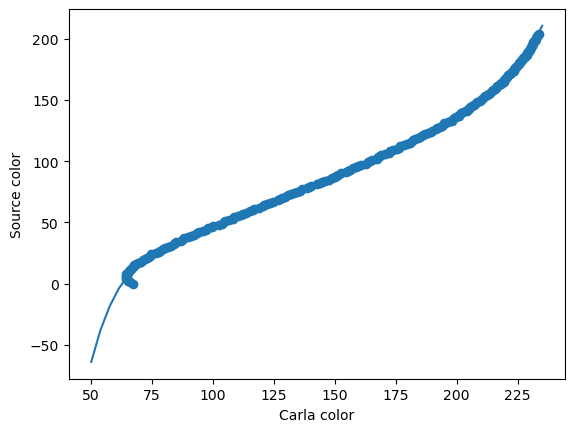

[ 3.07374271e-18 -4.28833701e-15  2.61834931e-12 -9.16884894e-10
  2.02549333e-07 -2.91960587e-05  2.73377674e-03 -1.58790015e-01
  5.03444015e+00 -5.36413682e+01 -6.24344638e+02]
65.64571578498192
64.84115385022824


In [15]:
Carla = df["mean"].to_numpy()
Source = df["X"].to_numpy()

# np.savetxt("carla.txt", Carla, delimiter=',')

# np.savetxt("source.txt", Source, delimiter=',')

#polynomial fit with degree = 2
model = np.poly1d(np.polyfit(Carla, Source, 10))

#add fitted polynomial line to scatterplot
polyline = np.linspace(50, 235, 50)
plt.xlabel('Carla color')
plt.ylabel('Source color')
plt.scatter(Carla, Source)
plt.plot(polyline, model(polyline))
plt.show()



converter = []

for x in range(256):
    converter = np.append(converter,round(model(x)))


print(model.c)

print(model(123))
print(model(122))


# STEP4: Replace colors in patch based on color mapping

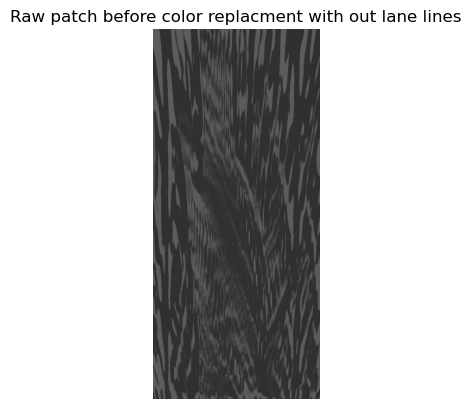

In [16]:
raw_patch = cv2.cvtColor(cv2.imread('data/patch_for_physical_before_color_change.png'), cv2.COLOR_BGR2RGB)

plt.title('Raw patch before color replacment with out lane lines')
plt.imshow(raw_patch)
plt.axis('off')
plt.show()

42.0
0
42.0
0
42.0
0
42.0
0
42.0
0
42.0
0
42.0
0
42.0
0
42.0
0
42.0
0
42.0
0
42.0
0
42.0
0
42.0
0
42.0
0
42.0
0
42.0
0
-64.0
0
-64.0
0
-64.0
0
-64.0
0
-64.0
0
-64.0
0
-64.0
0
-64.0
0
-64.0
0
-64.0
0
-64.0
0
-64.0
0
-64.0
0
-64.0
0
-64.0
0
-64.0
0
-64.0
0
-64.0
0
-64.0
0
-64.0
0
-64.0
0
-64.0
0
-64.0
0
-64.0
0
-64.0
0
-64.0
0
-64.0
0
-64.0
0
-64.0
0
-64.0
0
-64.0
0
-64.0
0
42.0
0
42.0
0
42.0
0
42.0
0
42.0
0
42.0
0
42.0
0
42.0
0
42.0
0
37.0
0
-5.0
0
-13.0
0
18.0
0
42.0
0
42.0
0
42.0
0
42.0
0
42.0
0
42.0
0
42.0
0
42.0
0
42.0
0
42.0
0
42.0
0
42.0
0
42.0
0
42.0
0
42.0
0
42.0
0
42.0
0
18.0
0
15.0
0
42.0
0
42.0
0
42.0
0
42.0
0
42.0
0
42.0
0
42.0
0
42.0
0
42.0
0
42.0
0
42.0
0
42.0
0
42.0
0
42.0
0
42.0
0
42.0
0
42.0
0
42.0
0
42.0
0
42.0
0
39.0
0
-64.0
0
-64.0
0
-64.0
0
-64.0
0
-64.0
0
-64.0
0
-64.0
0
-64.0
0
-64.0
0
-64.0
0
-64.0
0
-64.0
0
-64.0
0
-64.0
0
-64.0
0
-64.0
0
-43.0
0
42.0
0
42.0
0
42.0
0
42.0
0
42.0
0
42.0
0
42.0
0
4.0
0
-64.0
0
-64.0
0
-9.0
0
20.0
0
28.0
0
29.0
0
26.0
0
34.0
0
24.0

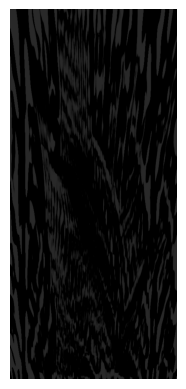

In [17]:
correctPatch = raw_patch.copy()
baseColor = np.array([0, 0, 0])
patch = raw_patch.clip(49, 210)

for i in range(correctPatch.shape[0]):
    for j in range(correctPatch.shape[1]):

        if(converter[correctPatch[i, j, 0]] > 0):
             correctPatch[i, j] = [converter[patch[i, j, 0]]] * 3
        else: 
            correctPatch[i, j] = baseColor
             

            
correctPatch = np.uint8(correctPatch)

saveLocation = "/Users/henry/Downloads/colorCorrectedPatch.png" #modify save location to your liking

plt.imshow(correctPatch)
plt.axis('off')
plt.savefig(saveLocation,bbox_inches='tight', pad_inches=0.0) 
plt.show()